# Install detectron2

In [1]:
!pip install pyyaml==5.1
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html

     |████████████████████████████████| 274 kB 5.3 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=be01b588d34ce18b9e047510aab468d7a3c99d8da722358d54014fd324ddee11
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
     |████████████████████████████████| 6.4 MB 801 kB/s 
     |████████████████████████████████| 145 kB 5.2 MB/s 
     |████████████████████████████████| 49 kB 5.6 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 130 kB 41.9 MB/s 
     |████████████████████████████████| 745 kB 39.8 MB/s 
     |████████████████████████████████| 743 kB 33.7 MB/s 
     |███

In [2]:
# check pytorch installation: 
!pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html
import torch, torchvision
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version
print(torch.__version__, torch.cuda.is_available())

Looking in links: https://download.pytorch.org/whl/torch_stable.html
1.9.0+cu102 True


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Register COCO dataset

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
%cd drive/MyDrive/JnJ Synthetic/data_conversion

/content/drive/MyDrive/JnJ Synthetic/data_conversion


In [6]:
# specify paths
train_path = '/content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/train/images'

In [7]:
# register new custom datasets to their catalog
register_coco_instances("train", {}, f'{train_path}/annotations.json', train_path)

dataset_dicts = DatasetCatalog.get('train')
train_metadata = MetadataCatalog.get('train')


# register validation dataset
val_path = '/content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/val/images'

register_coco_instances("val", {}, f'{val_path}/annotations.json', val_path)
val_dicts = DatasetCatalog.get('val')
val_metadata = MetadataCatalog.get('val')

[09/17 02:54:08 d2.data.datasets.coco]: Loading /content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/train/images/annotations.json takes 2.95 seconds.
WARNING [09/17 02:54:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/17 02:54:08 d2.data.datasets.coco]: Loaded 128 images in COCO format from /content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/train/images/annotations.json
WARNING [09/17 02:54:09 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/17 02:54:09 d2.data.datasets.coco]: Loaded 31 images in COCO format from /content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/val/images/annotations.json


In [8]:
print(dataset_dicts)

[{'file_name': '/content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/train/images/e03361ec-eba0-4bf5-8684-489755d4a0d7_rgb_38.png', 'height': 1080, 'width': 1920, 'image_id': 0, 'annotations': [{'iscrowd': 0, 'bbox': [1137.5, 289.5, 611.0, 254.0], 'category_id': 0, 'segmentation': [[1176.0, 543.5, 1186.0, 541.5, 1207.0, 540.5, 1221.0, 535.5, 1504.0, 410.5, 1553.0, 386.5, 1567.0, 377.5, 1592.0, 370.5, 1599.0, 366.5, 1628.0, 362.5, 1647.0, 357.5, 1698.0, 352.5, 1716.0, 347.5, 1731.0, 340.5, 1739.0, 334.5, 1745.5, 328.0, 1748.5, 317.0, 1744.0, 310.5, 1739.0, 307.5, 1724.0, 302.5, 1706.0, 303.5, 1687.0, 308.5, 1664.0, 310.5, 1661.0, 307.5, 1657.5, 307.0, 1657.0, 303.5, 1653.0, 303.5, 1648.0, 300.5, 1639.0, 302.5, 1627.0, 301.5, 1620.0, 304.5, 1611.0, 303.5, 1598.0, 305.5, 1597.0, 303.5, 1591.5, 304.0, 1592.5, 299.0, 1591.0, 297.5, 1583.0, 297.5, 1579.0, 294.5, 1572.0, 294.5, 1570.0, 291.5, 1564.0, 294.5, 1559.0, 290.5, 1546.0, 289.5, 1533.0, 293.5, 1527.0, 293.5, 1516.0, 

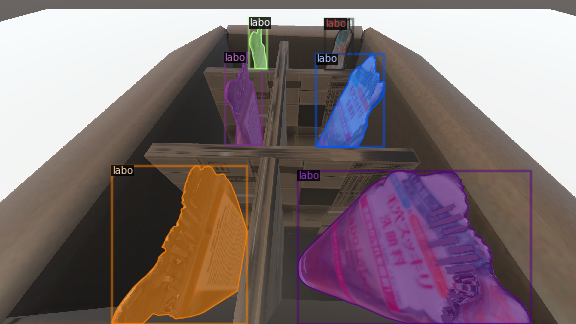

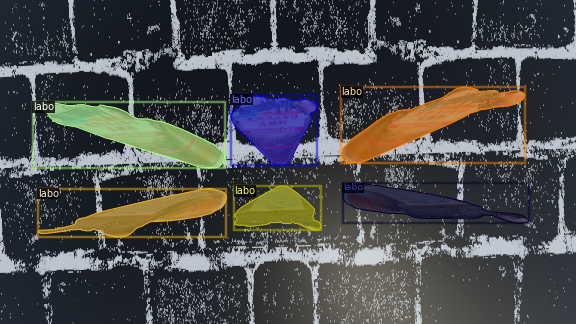

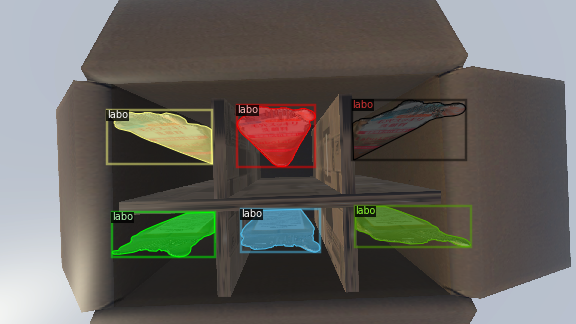

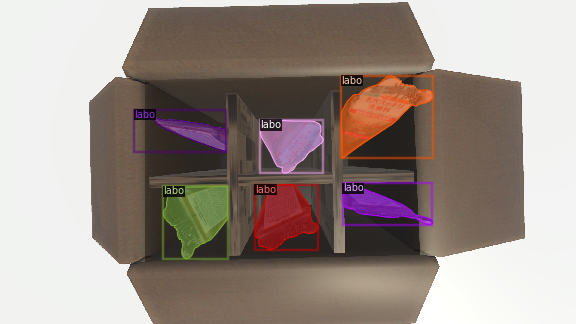

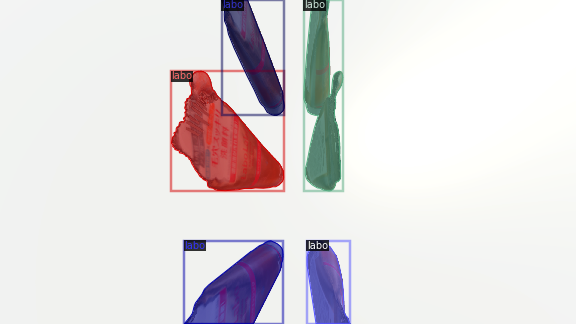

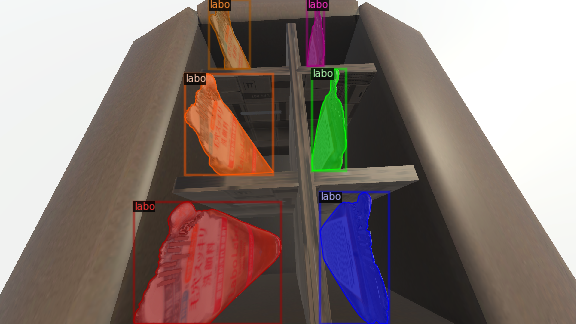

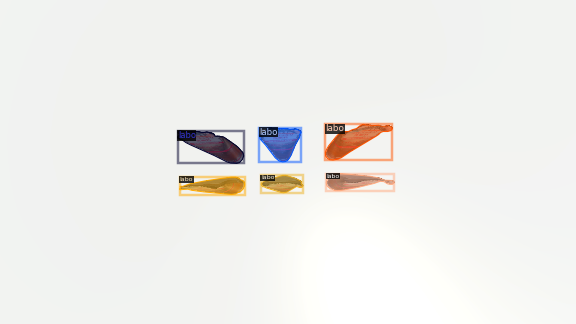

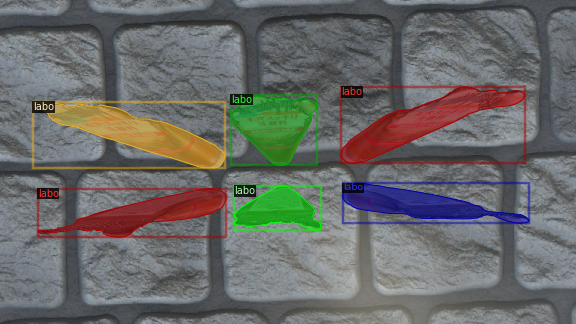

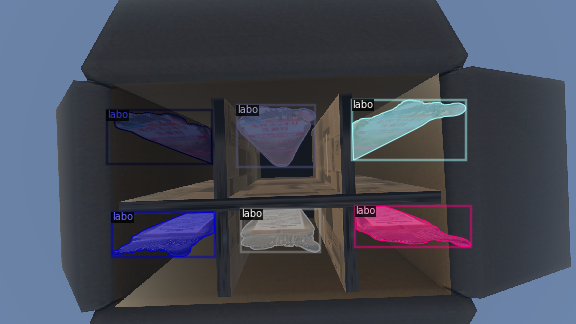

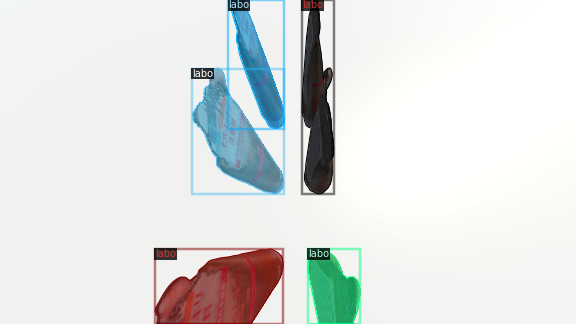

In [9]:
for d in random.sample(dataset_dicts, 10):
  file = d['file_name']
  img = cv2.imread(file)
  visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.3)
  out = visualizer.draw_dataset_dict(d)
  cv2_imshow(out.get_image()[:, :, ::-1])

# Finetune existing model

Use Mask RCNN R-50-FPN 1X, same model as in this repo:
https://github.com/onnx/models/tree/master/vision/object_detection_segmentation/mask-rcnn

In [25]:
# set cofigurations
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (labo). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.OUTPUT_DIR = '/content/drive/MyDrive/JnJ Synthetic/data_conversion/output'


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [16]:
print(cfg.MODEL.DEVICE)

cuda


In [26]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[09/16 07:20:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[09/16 07:20:08 d2.engine.train_loop]: Starting training from iteration 0
[09/16 07:20:37 d2.utils.events]:  eta: 0:35:13  iter: 19  total_loss: 2.372  loss_cls: 0.7392  loss_box_reg: 0.8885  loss_mask: 0.694  loss_rpn_cls: 0.007243  loss_rpn_loc: 0.01636  time: 1.4106  data_time: 0.0298  lr: 4.9953e-06  max_mem: 2854M
[09/16 07:21:05 d2.utils.events]:  eta: 0:34:46  iter: 39  total_loss: 2.369  loss_cls: 0.7047  loss_box_reg: 0.9328  loss_mask: 0.6735  loss_rpn_cls: 0.01092  loss_rpn_loc: 0.01863  time: 1.4056  data_time: 0.0095  lr: 9.9902e-06  max_mem: 2854M
[09/16 07:21:34 d2.utils.events]:  eta: 0:34:48  iter: 59  total_loss: 2.205  loss_cls: 0.6319  loss_box_reg: 0.8944  loss_mask: 0.6357  loss_rpn_cls: 0.008493  loss_rpn_loc: 0.01707  time: 1.4265  data_time: 0.0082  lr: 1.4985e-05  max_mem: 2854M
[09/16 07:22:03 d2.utils.events]:  eta: 0:35:03  iter: 79  total_loss: 2.091  loss_cls: 0.5864  loss_box_reg: 0.9087  loss_mask: 0.5813  loss_rpn_cls: 0.008562  loss_rpn_loc: 0.01695  

In [1]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

# Run inference on validation set

In [19]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

visualize some samples

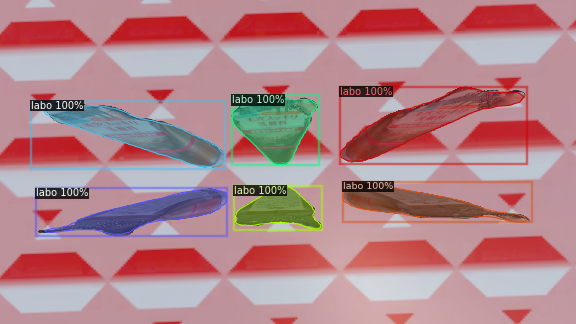

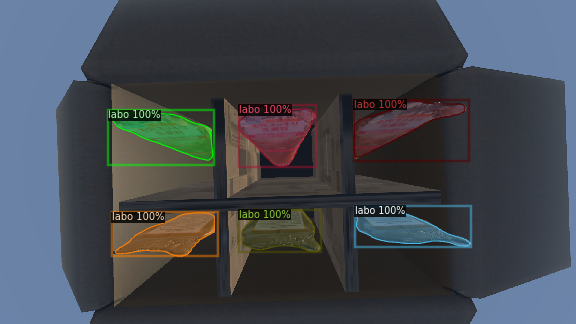

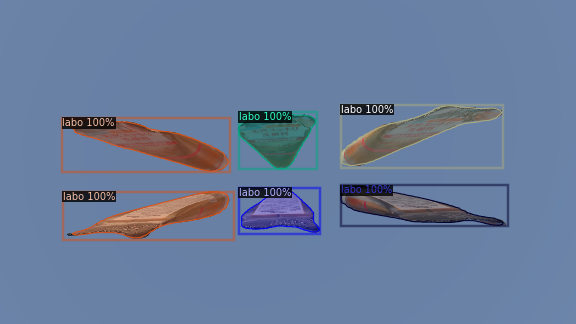

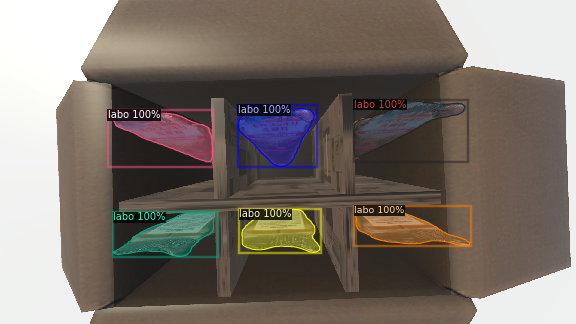

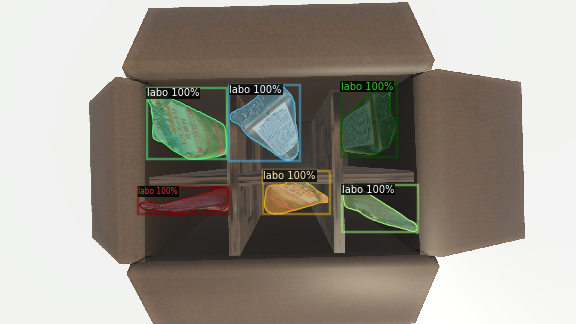

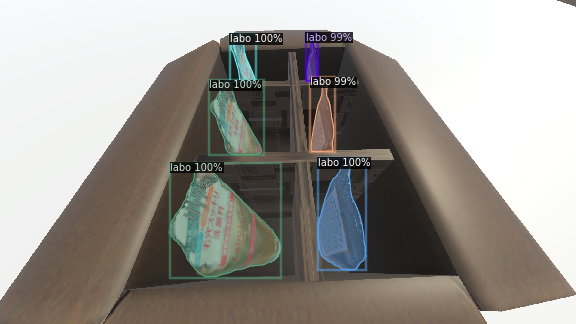

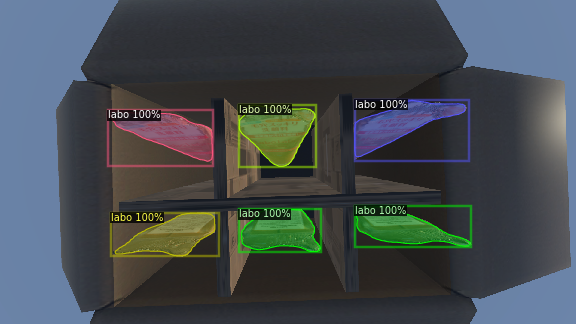

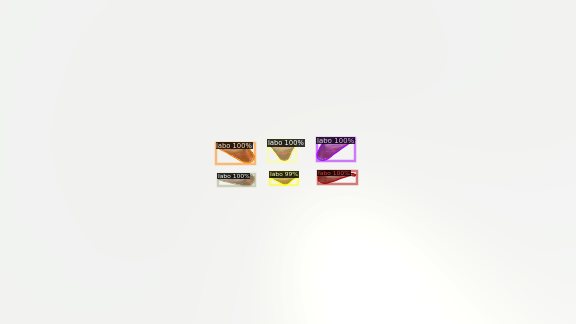

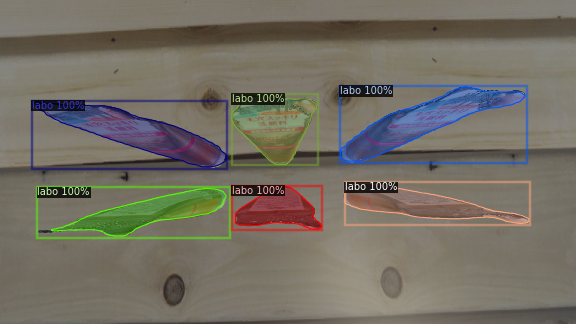

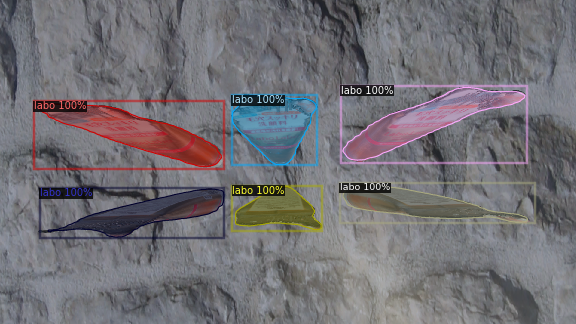

In [20]:
for d in random.sample(val_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata= val_metadata, 
                   scale=0.3, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [21]:
evaluator = COCOEvaluator("val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

WARNING [09/16 07:17:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/16 07:17:43 d2.data.datasets.coco]: Loaded 31 images in COCO format from /content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/val/images/annotations.json
[09/16 07:17:43 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/16 07:17:43 d2.data.common]: Serializing 31 elements to byte tensors and concatenating them all ...
[09/16 07:17:44 d2.data.common]: Serialized dataset takes 0.18 MiB
[09/16 07:17:44 d2.evaluation.evaluator]: Start inference on 31 batches
[09/16 07:17:49 d2.evaluation.evaluator]: Inference done 11/31. Dataloading: 0.0018 s/iter. Inference: 0.3727 s/iter. Eval: 0.0420 s/iter. Total: 0.4165 s/iter. ETA=0:00:08
[09/16 07:17:54 d2.evaluation.evaluator]: Inference done 23/31. Dataloading: 0.0047 s/iter.

# Run inference on test set

In [28]:
# register test dataset
test_path = '/content/drive/MyDrive/JnJ Synthetic/data_conversion/data/labo_5/final/test'

register_coco_instances("test", {}, f'{test_path}/annotations.json', test_path)
test_dicts = DatasetCatalog.get('test')
test_metadata = MetadataCatalog.get('test')

AssertionError: ignored

In [29]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

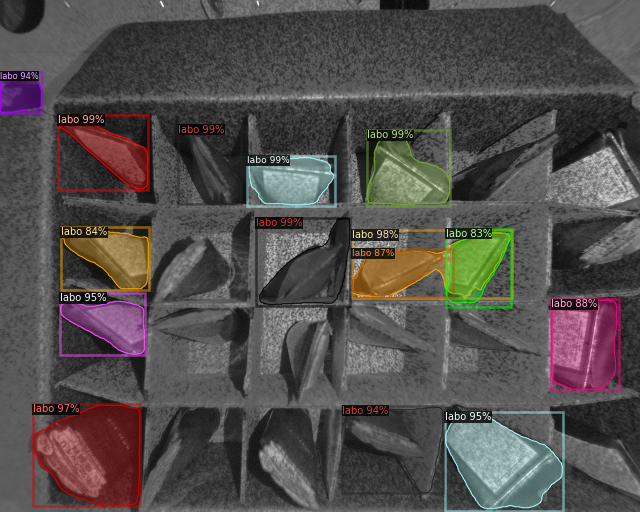

In [30]:
for d in random.sample(test_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata= test_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])